# Decoding mouse from session sequences


In [1]:
prefix = '/home/ines/repositories/'
# prefix = '/Users/ineslaranjeira/Documents/Repositories/'

In [2]:
""" 
IMPORTS
"""
import os
import autograd.numpy as np
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# --Machine learning and statistics
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler,  LabelBinarizer
from sklearn.cluster import KMeans
import random
from sklearn import mixture
import pickle
from scipy.stats import mode
from sklearn.inspection import permutation_importance

# --Machine learning and statistics
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.preprocessing import OneHotEncoder
from scipy.stats import entropy

# Get my functions
functions_path =  prefix + 'representation_learning_variability/Functions/'
os.chdir(functions_path)
from data_processing import save_and_log
functions_path =  prefix + 'representation_learning_variability/Models/Sub-trial//2_fit_models/'
os.chdir(functions_path)
from preprocessing_functions import idxs_from_files
functions_path =  prefix + 'representation_learning_variability/Models/Sub-trial//3_postprocess_results/'
os.chdir(functions_path)
from plotting_functions import create_grouped_gradient_palette

from one.api import ONE
one = ONE(mode='remote')

/home/ines/miniconda3/envs/iblenv/lib/python3.9/site-packages/one/alf/files.py:10: FutureWarning: `one.alf.files` will be removed in version 3.0. Use `one.alf.path` instead.
  warnings.warn(


## Parameters

In [3]:
# Parameters
bin_size = 0.017
num_states = 2
threshold = 0.0
optimal_k = 4

save_path = prefix + 'representation_learning_variability/DATA/Sub-trial/Results/'  + str(bin_size) + '/'+str(num_states)+'_states/most_likely_states/'

# LOAD DATA
data_path = prefix + 'representation_learning_variability/DATA/Sub-trial/Design matrix/' + 'v5_15Jan2025/' + str(bin_size) + '/'
all_files = os.listdir(data_path)
design_matrices = [item for item in all_files if 'design_matrix' in item and 'standardized' not in item]
idxs, mouse_names = idxs_from_files(design_matrices, bin_size)

states_path =  prefix + 'representation_learning_variability/DATA/Sub-trial/Results/' + str(bin_size) + '/'+str(num_states)+'_states/most_likely_states/'
wavelet_states_path = prefix + 'representation_learning_variability/DATA/Sub-trial/Results/'  + str(bin_size) + '/wavelet_transform_states/'

path_sets = [wavelet_states_path, states_path, states_path]


# Individual sessions

In [4]:
# Identify sessions available to process
sessions_to_process = []
for m, mat in enumerate(idxs):
    mouse_name = mat[37:]
    session = mat[:36]
    fit_id = str(mouse_name + session)
    whisker_filename = os.path.join(states_path, "most_likely_states" + 'whisker_me' + '_' + fit_id)
    licks_filename = os.path.join(states_path, "most_likely_states" + 'Lick count' + '_' + fit_id)
    wavelet_filename = os.path.join(wavelet_states_path, "most_likely_states_" + str(optimal_k) + '_' + fit_id)

    if os.path.exists(whisker_filename) and os.path.exists(licks_filename) and os.path.exists(wavelet_filename):
        sessions_to_process.append((mouse_name, session))

print(f"Found {len(sessions_to_process)} sessions to process.")

Found 215 sessions to process.


## Get sequences per trial epoch

In [8]:
results_path = prefix + 'representation_learning_variability/Models/Sub-trial/4_analyses/1_HMM_states/'
filename = str(results_path + 'epoch_sequences_10_03-11-2025')
all_sequences = pickle.load(open(filename, 'rb'))

In [9]:
design_df = all_sequences.pivot(index=['sample', 'trial_type', 'mouse_name'], columns=['broader_label'], values='binned_sequence').reset_index().dropna()
var_names = design_df.keys()[-4:]

In [11]:
df = design_df.copy()
df['feedback'] = df['trial_type'].str.split().str[:1].str.join('')
df['choice'] = df['trial_type'].str.split().str[3:4].str.join('')
df['block'] = df['trial_type'].str.split().str[2:3].str.join('')
df['contrast'] = df['trial_type'].str.split().str[1:2].str.join('')
df['side'] = df['choice'].copy()
df.loc[(df['feedback']=='correct') & (df['choice']=='right'), 'side'] = 'left'
df.loc[(df['feedback']=='correct') & (df['choice']=='left'), 'side'] = 'right'

df['session'] = df['sample'].str.split().str[:1].str.join('')
df['trial_id'] = df['sample'].str.split().str[1:2].str.join('')

df['contrast'] = df['contrast'].astype(float)
df['block'] = df['block'].astype(float)

df['choice'] = df['trial_type'].str.split().str[3:4].str.join('')
df.loc[df['choice']=='left', 'choice'] = 0
df.loc[df['choice']=='right', 'choice'] = 1

df.loc[df['feedback']=='correct', 'feedback'] = 1
df.loc[df['feedback']=='incorrect', 'feedback'] = 0

## Get metadata

In [14]:
sessions = df.session.unique()

metadata = pd.DataFrame(columns=['session', 'lab', 'rig', 'users'], index=range(len(sessions)))
for s, session in enumerate(sessions):
    try:
        session_details = one.get_details(session, full=True)

        metadata['session'][s] = session
        metadata['lab'][s] = session_details['lab']
        metadata['rig'][s] = session_details['location']
        metadata['users'][s] = session_details['users']
    except:
        print(session)

/tmp/ipykernel_10573/2615688291.py:8: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  metadata['session'][s] = session
/tmp/ipykernel_10573/2615688291.py:9: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are se

251ece37-7798-477c-8a06-2845d4aa270c


In [24]:
file_to_save = metadata.copy()
filename = "metadata"
save_path = prefix + 'representation_learning_variability/Models/Sub-trial/4_analyses/6_Mouse_decoding/'
file_format = 'parquet'
script_name = '4.6.2_mouse_decoder.ipynb'
meta = save_and_log(file_to_save, filename, file_format, save_path, script_name)

## Get learning speed

In [ ]:
data_path = prefix + 'representation_learning_variability/DATA/'
# data_path =  '/Users/ineslaranjeira/Documents/Repositories/representation_learning_variability/DATA/'
learning_df = pd.read_csv(data_path+'learning_private_one.csv')  
learning_times = learning_df[['subject_nickname', 'training_time']].drop_duplicates()
learning_times = learning_times.rename(columns={"subject_nickname": "mouse_name"}).reset_index()

data_path =  prefix + 'representation_learning_variability/DATA/'
learning_df = pd.read_parquet(data_path+'training_time_03-21-2025', engine='pyarrow')
learning_times_new = learning_df.rename(columns={"subject_nickname": "mouse_name"}).reset_index()

# new_df = design_df.droplevel(1, axis=1)[['mouse_name', 'session']]
# df = new_df.merge(learning_times, on='mouse_name')
a = learning_times.merge(learning_times_new, on='mouse_name', how='outer')
b = a.loc[a['training_time_x'].isna()]
b = b.rename(columns={"training_time_y": "training_time"}).reset_index()

full_learning = pd.concat([learning_times[['mouse_name', 'training_time']], b[['mouse_name', 'training_time']]]).reset_index()

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_73598/3750467177.py:3: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  learning_df = pd.read_csv(data_path+'learning_private_one.csv')


In [ ]:
df =df.merge(learning_times_new, on=['mouse_name'])
df['quartile'] = pd.qcut(df['training_time'], q=[0, .25, .5, .75, 1], labels=[1, 2, 3, 4])

In [30]:
df = df.merge(metadata, on=['session'])

## Get session part' sequences

In [33]:
trials_filename = str(results_path + 'cluster_per_trial_part_info03-21-2025')
trial_clusters = pd.read_parquet(trials_filename, engine='pyarrow')
parts_filename = str(results_path + 'cluster_per_session_part03-21-2025')
parts_clusters = pd.read_parquet(parts_filename, engine='pyarrow')

In [35]:
df = parts_clusters[['sample', 'mouse_name', 'part_cluster', 'UMAP1', 'UMAP2']].drop_duplicates()
df['part'] = df['sample'].str.split().str[1:2].str.join('')


In [38]:
session_num = df.groupby(['mouse_name'])['part'].count()
use_data = df[['mouse_name', 'UMAP1', 'UMAP2', 'part_cluster']].merge(session_num.reset_index(), on='mouse_name')


In [48]:
plot = False
target_length = 3

all_sequences = pd.DataFrame(columns=['sample', 'mouse_name', 'trial_type', 'cluster', 'bin'])
for s, sample in enumerate(trial_clusters['sample'].unique()):

    # Get session data and order trials
    session_data = trial_clusters.loc[trial_clusters['sample']==sample]
    session_data = session_data[['sample', 'mouse_name', 'trial_id', 'trial_type', 'cluster']].drop_duplicates()
    session_data['trial_id'] = session_data['trial_id'].astype(float)
    session_data = session_data.sort_values(by=['trial_id'])

    # Bin 
    n_trials = len(session_data)
    # Assign bin index: split into 10 parts
    bin_indices = pd.qcut(np.arange(n_trials), q=target_length, labels=False)
    session_data['bin'] = bin_indices
      
    all_sequences = pd.concat([all_sequences, session_data[['sample', 'mouse_name',
                                                            'trial_type', 'cluster', 'bin']]], ignore_index=True)

In [49]:
fractions = all_sequences.groupby(['sample', 'mouse_name',
                                   'bin'])['cluster'].value_counts(normalize=True).rename('fraction').reset_index().sort_values(by=['bin', 'cluster'])
fractions

,sample,mouse_name,bin,cluster,fraction
5,03063955-2523-47bd-ae57-f7489dd40f15 0.0,SWC_038,0,0,0.083333
25,03063955-2523-47bd-ae57-f7489dd40f15 1.0,SWC_038,0,0,0.111111
47,032452e9-1886-449d-9c13-0f192572e19f 0.0,SWC_053,0,0,0.044118
66,032452e9-1886-449d-9c13-0f192572e19f 1.0,SWC_053,0,0,0.104478
86,034e726f-b35f-41e0-8d6c-a22cc32391fb 0.0,CSHL045,0,0,0.154639
...,...,...,...,...,...
8115,fc43390d-457e-463a-9fd4-b94a0a8b48f5 1.0,NYU-47,2,6,0.114583
8132,ff48aa1d-ef30-4903-ac34-8c41b738c1b9 0.0,CSH_ZAD_025,2,6,0.202532
8151,ff48aa1d-ef30-4903-ac34-8c41b738c1b9 1.0,CSH_ZAD_025,2,6,0.197452
8171,ff96bfe1-d925-4553-94b5-bf8297adf259 0.0,ibl_witten_26,2,6,0.200000


In [50]:
design_df = fractions.pivot(index=['mouse_name', 'sample'], columns=['bin', 'cluster'], values='fraction').reset_index().fillna(0)
var_names = design_df.keys()[2:]
final_matrix = design_df[var_names]

([<matplotlib.axis.XTick at 0x79533b241190>], [Text(0, 0, '0')])

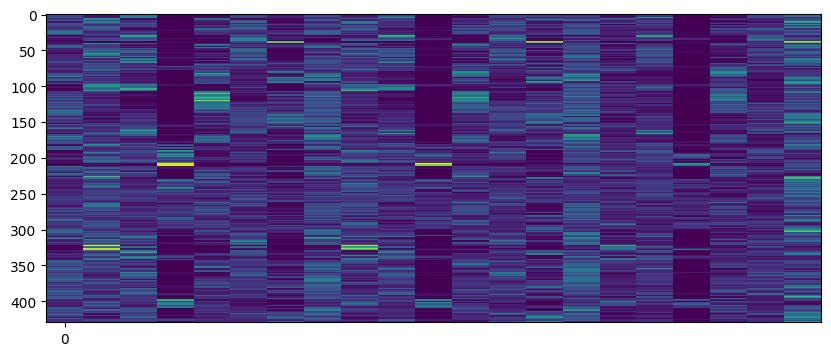

In [51]:
plt.figure(figsize=(10, 4))
plt.imshow(final_matrix, aspect='auto', cmap='viridis', interpolation='none')
plt.xticks(np.arange(0, np.shape(final_matrix)[1], 160), np.arange(0, np.shape(final_matrix)[1], 160))

# Get data of interest for decoder

In [153]:
def split_sessions(trial_clusters, n_parts):

    rng = np.random.default_rng() 

    trial_clusters['session_part'] = trial_clusters['response'] * np.nan

    for s, session in enumerate(trial_clusters.session.unique()):
        session_df = trial_clusters.loc[trial_clusters['session']==session]
        n_trials = len(session_df)
        # Create shuffled labels for parts
        parts = np.tile(np.arange(n_parts), int(np.ceil(n_trials / n_parts)))[:n_trials]
        rng.shuffle(parts)  # Shuffle to randomize assignment
        # els.extend(parts)
        trial_clusters.loc[trial_clusters['session']==session, 'session_part'] = parts

    # Assign to new column
    trial_clusters['session_part'] = trial_clusters['session_part'].astype(str)
    trial_clusters = trial_clusters.rename(columns={"sample": "old_sample"})
    trial_clusters['sample'] = trial_clusters[['session', 'session_part']].agg(' '.join, axis=1)
    
    split_session_df = trial_clusters.copy()
    
    return split_session_df


def get_fraction_vectors(trial_clusters, target_length):

    all_sequences = pd.DataFrame(columns=['sample', 'mouse_name', 'trial_type', 'cluster', 'bin'])
    for s, sample in enumerate(trial_clusters['sample'].unique()):

        # Get session data and order trials
        session_data = trial_clusters.loc[trial_clusters['sample']==sample]
        session_data = session_data[['sample', 'mouse_name', 'trial_id', 'trial_type', 'cluster']].drop_duplicates()
        session_data['trial_id'] = session_data['trial_id'].astype(float)
        session_data = session_data.sort_values(by=['trial_id'])

        # Bin 
        n_trials = len(session_data)
        # Assign bin index: split into 10 parts
        bin_indices = pd.qcut(np.arange(n_trials), q=target_length, labels=False)
        session_data['bin'] = bin_indices
        
        all_sequences = pd.concat([all_sequences, session_data[['sample', 'mouse_name',
                                                                'trial_type', 'cluster', 'bin']]], ignore_index=True)

    fractions = all_sequences.groupby(['sample', 'mouse_name',
                                    'bin'])['cluster'].value_counts(normalize=True).rename('fraction').reset_index().sort_values(by=['bin', 'cluster'])
    design_df = fractions.pivot(index=['mouse_name', 'sample'], columns=['bin', 'cluster'], values='fraction').reset_index().fillna(0)

    return design_df
    
    
def prepare_design_mat(design_df):
    decoded_var = 'mouse_name'
    var = 'fact_var'

    mat = pd.DataFrame(design_df)
    mat['fact_var'] = pd.factorize(design_df[decoded_var])[0]
    mat[decoded_var] = design_df[decoded_var]

    use_labels = mat['fact_var'].unique()

    named_labels = mat.loc[mat['fact_var'].isin(use_labels), decoded_var].drop_duplicates()
    use_mat_pre = mat.loc[mat['fact_var'].isin(use_labels)]
    array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))
    use_mat = pd.DataFrame(array_mat[:, :-1])
    use_mat[var] = use_mat_pre[var]
    
    return use_mat, named_labels

## Decode mouse

In [55]:
def plot_cm(decoding_result, trial_epochs, size, control=False):
    """
    PLOT RESULTS
    """

    # -- Confusion Matrix
    # labels = trial_epochs

    # Results on original model
    plt.rc('font', size=9) 
    plt.figure(figsize=size)
    hmap = sns.color_palette("mako", as_cmap=True)
    data = decoding_result.loc[decoding_result['shuffle'] == 0]
    sns.heatmap(data['confusion_matrix'].mean(), annot=False, square=True,
        yticklabels=trial_epochs, xticklabels=trial_epochs, 
        cmap= hmap, vmin=0, vmax=1, fmt=".2f") 

    # plt.xticks([.5, 1.5, 2.5, 3.5], trial_epochs)
    # plt.yticks([.5, 1.5, 2.5, 3.5], trial_epochs)
    plt.xticks(rotation = 90)
    plt.yticks(rotation = 0)
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.savefig('full_cm.svg',dpi=500)
    plt.show()
    print('F1 results', data['f1'].mean())

    if control:
        # Results from shuffled model
        plt.rc('font', size=9) 
        plt.figure(figsize=size)
        data = decoding_result.loc[decoding_result['shuffle'] >0]
        sns.heatmap(data['confusion_matrix'].mean(), annot=False, square=True,
            yticklabels=trial_epochs, xticklabels=trial_epochs, 
            cmap= hmap, vmin=0, vmax=1, fmt=".2f")

        # plt.xticks([.5, 1.5, 2.5, 3.5], trial_epochs)
        # plt.yticks([.5, 1.5, 2.5, 3.5], trial_epochs)
        plt.xticks(rotation = 90)
        plt.yticks(rotation = 0)
        plt.xlabel('Predicted label')
        plt.ylabel('True label')
        plt.show()
        print('F1 shuffled results',  data['f1'].mean())
    plt.tight_layout()

def plot_f1(decoding_result):
    # -- F1 score per model, original and shuffled
    data = decoding_result.copy()
    data['f1'] = data['f1'].astype(float)

    data.loc[data['shuffle'] >= 1, 'shuffle'] = 'Shuffled'
    data.loc[data['shuffle'] == 0, 'shuffle'] = 'Original'
    data = data.rename(columns={'shuffle': 'Dataset'})

    plt.rc('font', size=12) 
    plt.figure(figsize=[4.5, 4])
    sns.boxplot(y='f1', x='Dataset', data=data, color='grey') 
    sns.swarmplot(y='f1', x='Dataset', data=data, color='black', dodge=True, alpha=0.7, size=3)
    plt.ylim([0,1])
    plt.ylabel('Accuracy score (F1)')
    plt.legend(bbox_to_anchor=(1.05, 1))
    sns.despine(top=True, right=True)
    #plt.savefig('violin.svg',dpi=500)
    

In [159]:
shufflings = 2 #shuffling
repeats = 20
model = RandomForestClassifier(random_state=42)
# model = MultinomialNB()

n_parts = 2  # Only 2 parts to make sure session patterns are preserved
target_length = 3
var = 'fact_var'

In [160]:
"""
RUN MODEL
"""

# Generate random states for each iteration with a fixed seed
# Loop over iterations of random draws of mice
# Create empty dataframes to save results
decoding_result = pd.DataFrame(columns=['shuffle', 'repeat', 'f1', 'confusion_matrix'])
dec_result = pd.DataFrame(columns=['shuffle', 'repeat', 'f1', 'confusion_matrix'])

for r in range(repeats):
    print('Repeat %d of %d' % (r+1, repeats))  
        
    # Split data anew
    split_session_df = split_sessions(trial_clusters, n_parts)
    design_df = get_fraction_vectors(trial_clusters, target_length)
    use_mat, named_labels = prepare_design_mat(design_df)
    
    # Decoding function with 10-fold cross validation
    kf = KFold(n_splits=20, shuffle=True, random_state=0)
    # use_mat = mat.copy() # test using all mice

    # Find minimum number of samples per label
    labels = np.array(use_mat[var])
    labels_nr = np.arange(len(use_mat[var]))
    min_freq = np.min(use_mat[var].value_counts())
    # min_freq = 400

    # Randomly select N mice from each quartile to equalize classes
    use_index = np.empty(0, dtype=int)
    for j, epoch in enumerate(np.unique(labels)):
        use_index = np.concatenate([use_index, np.random.choice(labels_nr[labels == epoch],
                                                                min_freq, replace=False)])

    new_mat = use_mat.iloc[use_index].reset_index().drop(columns=['index']).copy()
            
    # -- ORIGINAL DATASET

    # dec_result = pd.DataFrame(columns=['shuffle', 'f1', 'confusion_matrix'])
    y_pred = np.zeros(len(new_mat), dtype=int) 
    exog = new_mat[new_mat.columns.difference([var])]
    endog = new_mat.loc[:, var].copy()
    # endog[:] = replace_func(endog)

    for train_index, test_index in kf.split(new_mat):
        model.fit(exog.iloc[train_index], endog.iloc[train_index].astype(int))
        # model.fit(exog.iloc[train_index], endog.iloc[train_index])
        y_pred[test_index] = model.predict(exog.iloc[test_index])

    # Calculate f1 score and confusion matrix
    f1 = f1_score(endog.astype(int), y_pred.astype('int'), average='micro')
    cm = confusion_matrix(endog.astype(int), y_pred.astype('int'), normalize='true')

    # Save results
    dec_result.loc[0, 'f1'] = f1
    dec_result.loc[0, 'confusion_matrix'] = cm
    dec_result.loc[0, 'shuffle'] = 0
    dec_result.loc[0, 'repeat'] = r

    decoding_result = pd.concat([decoding_result, dec_result])

    # -- SHUFFLED DATASET 
    shuffle_result = pd.DataFrame(columns=['shuffle', 'repeat', 'f1', 'confusion_matrix'])
    for s in range(shufflings):
        if np.mod(s+1, 10) == 0:
            print('Shuffling %d of %d' % (s+1, shufflings))   

        shuffle_y_pred = np.zeros(len(new_mat), dtype=int) 
        shuffle_endog = endog.copy()
        np.random.shuffle(shuffle_endog.values)

        for train_index, test_index in kf.split(new_mat):
            model.fit(exog.iloc[train_index], list(shuffle_endog.iloc[train_index].astype(int)))
            shuffle_y_pred[test_index] = model.predict(exog.iloc[test_index])   

        shuffle_f1 = f1_score(shuffle_endog.astype(int), shuffle_y_pred.astype('int'), average='micro')
        shuffle_cm = confusion_matrix(shuffle_endog.astype(int), shuffle_y_pred.astype('int'), normalize='true')

        # SAVE
        shuffle_result.loc[s, 'f1'] = shuffle_f1
        shuffle_result.loc[s, 'confusion_matrix'] = shuffle_cm
        shuffle_result.loc[s, 'shuffle'] = s + 1
        shuffle_result.loc[s, 'repeat'] = r

    decoding_result = pd.concat([decoding_result, shuffle_result])

Repeat 1 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 2 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 3 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 4 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 5 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 6 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 7 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 8 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 9 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 10 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 11 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 12 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 13 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 14 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 15 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 16 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 17 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 18 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 19 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


Repeat 20 of 20


/tmp/ipykernel_10965/2917378054.py:65: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample']))


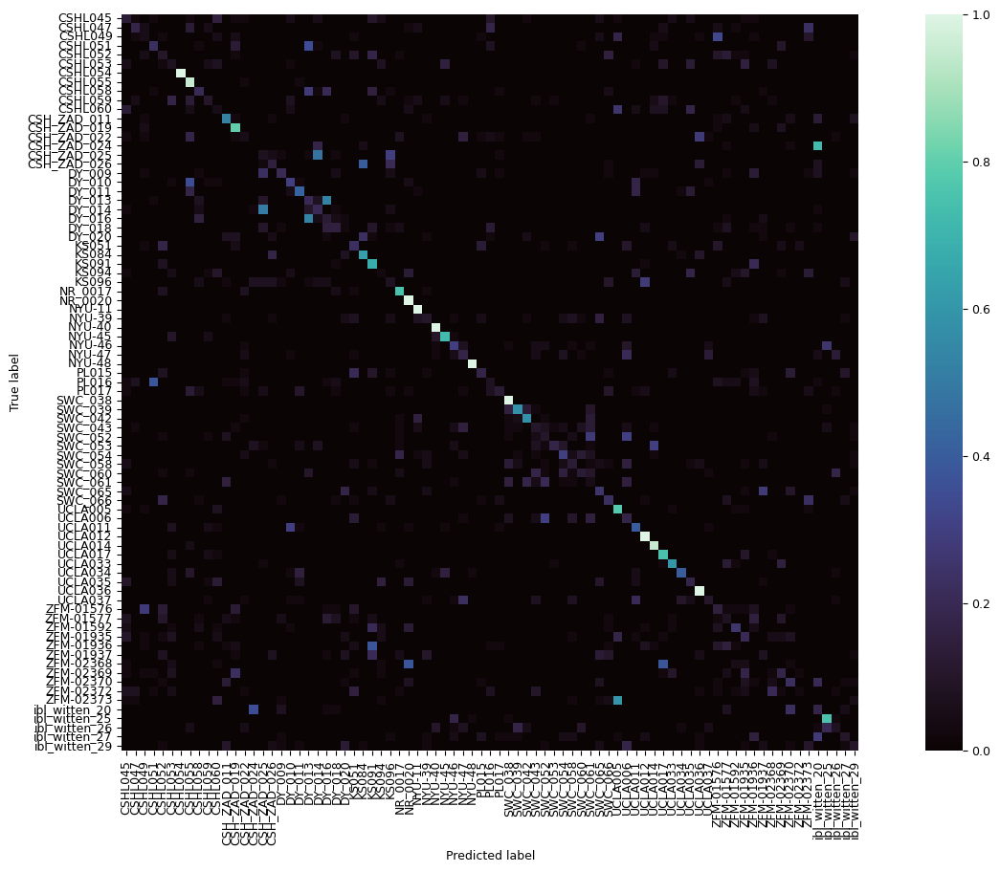

F1 results 0.3283950617283951


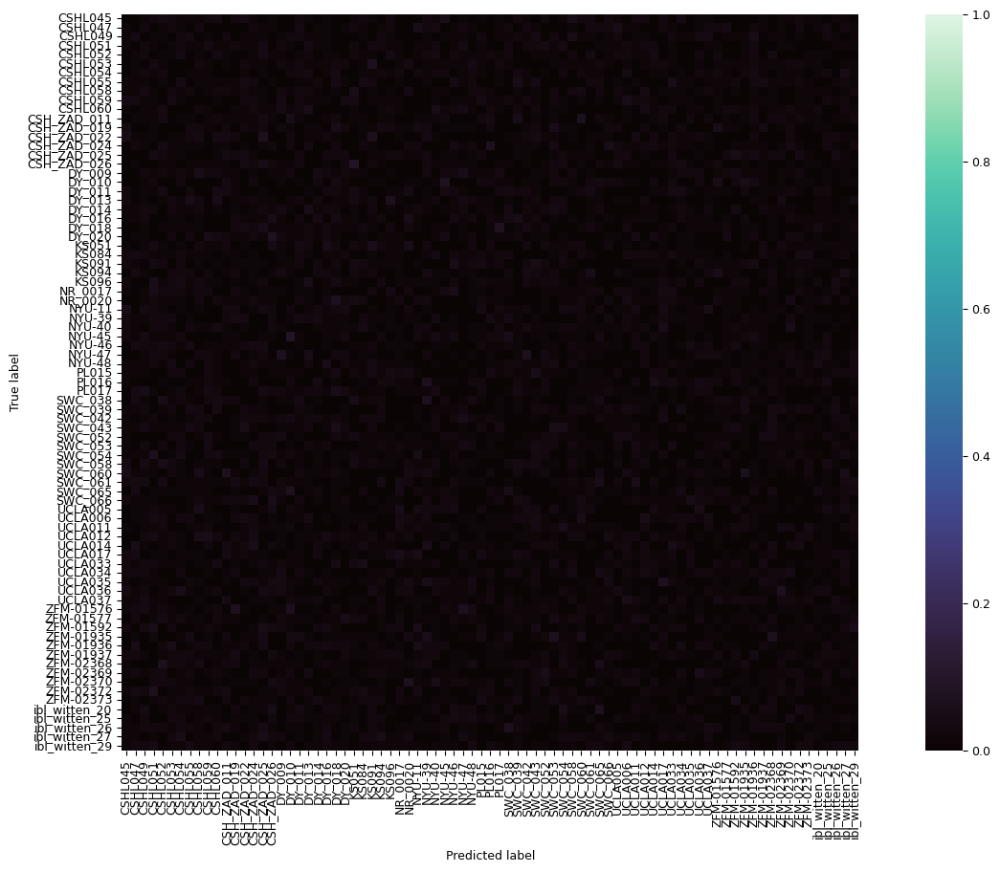

F1 shuffled results 0.004475308641975309


/tmp/ipykernel_10965/1589584115.py:62: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05, 1))


<Figure size 640x480 with 0 Axes>

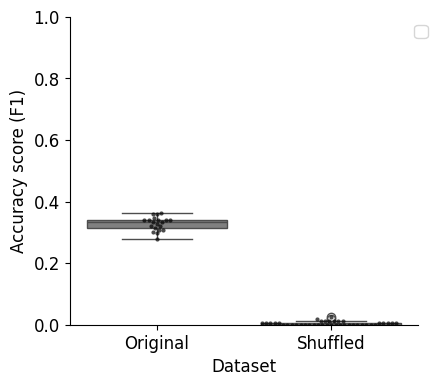

In [164]:
plot_cm(decoding_result, named_labels, [18, 10], control=True)
plot_f1(decoding_result)
# decoding_ratio = decoding_result.loc[decoding_result['shuffle']==0, 'f1']/decoding_result.loc[decoding_result['shuffle']==1, 'f1']
# print(decoding_ratio)

## Compute importances

In [28]:
"""
RUN MODEL
"""

shufflings = 1
# Generate random states for each iteration with a fixed seed
# Loop over iterations of random draws of mice
# Create empty dataframes to save results
decoding_result = pd.DataFrame(columns=['shuffle', 'f1', 'confusion_matrix', 'importances'], index=range(shufflings))

for s in range(shufflings):
    print('Shuffling %d of %d' % (s, shufflings))
    # if np.mod(s+1, 10) == 0:
    #     print('Shuffling %d of %d' % (s+1, shufflings))   
        
    # Decoding function with 10-fold cross validation
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    use_mat = mat.copy() # test using all mice

    # Find minimum number of samples per label
    labels = np.array(use_mat[var])
    labels_nr = np.arange(len(use_mat[var]))
    min_freq = np.min(use_mat[var].value_counts())

    # Randomly select N mice from each quartile to equalize classes
    use_index = np.empty(0, dtype=int)
    for j, epoch in enumerate(np.unique(labels)):
        use_index = np.concatenate([use_index, np.random.choice(labels_nr[labels == epoch],
                                                                min_freq, replace=False)])

    new_mat = use_mat.iloc[use_index].reset_index().drop(columns=['index']).copy()
            
    # -- ORIGINAL DATASET
    dec_result = pd.DataFrame(columns=['shuffle', 'f1', 'confusion_matrix', 'importances'])
    y_pred = np.zeros(len(new_mat), dtype=int) 
    exog = new_mat[new_mat.columns.difference([var])]
    endog = new_mat.loc[:, var].copy()

    iter_importances = np.zeros((5, np.shape(exog)[1])) * np.nan
    fold = 0
    for train_index, test_index in kf.split(new_mat):
        model.fit(exog.iloc[train_index], endog.iloc[train_index].astype(int))
        y_pred[test_index] = model.predict(exog.iloc[test_index])

        result = permutation_importance(model, exog.iloc[test_index], y_pred[test_index], 
                                        n_repeats=10, random_state=42, n_jobs=2)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)


        mdi_importances = pd.Series(model[-1].feature_importances_) 
        iter_importances[fold, :] = np.array(mdi_importances)
        fold = fold +1
        
    # Calculate f1 score and confusion matrix
    f1 = f1_score(endog.astype(int), y_pred.astype('int'), average='micro')
    cm = confusion_matrix(endog.astype(int), y_pred.astype('int'), normalize='true')

    # Save results
    dec_result.loc[0, 'f1'] = f1
    dec_result.loc[0, 'confusion_matrix'] = cm
    dec_result.loc[0, 'shuffle'] = s
    dec_result.loc[0, 'importances'] = iter_importances

    decoding_result = pd.concat([decoding_result, dec_result])

Shuffling 0 of 1


In [121]:
result = permutation_importance(model, np.array(exog.iloc[test_index]), y_pred[test_index], 
                                        n_repeats=1, random_state=42, n_jobs=1)

KeyboardInterrupt: 

In [ ]:
result

In [129]:
use_states = int(max(np.unique(use_sequences)))+1
timesteps = np.shape(use_sequences)[1]
reshaped_importances = np.zeros((use_states, timesteps)) * np.nan
reshaped_importances = pd.DataFrame(columns=['syllable', 'timestep', 'importance', 'repeat'], index=range(use_states * timesteps))

for s in range(shufflings):
       for t in range(timesteps):
              mdi_importances = decoding_result.loc[decoding_result['shuffle']==s, 'importances']
              importances = np.mean(mdi_importances[0], axis=0)
              reshaped_importances['syllable'][t*use_states:(t+1)*use_states] = ['000', '100', '200', '300', '010', '110',
                     '210', '310', '001', '101', '201', '301', '011',
                     '111', '211', '311']
              reshaped_importances['timestep'][t*use_states:(t+1)*use_states] = t
              reshaped_importances['importance'][t*use_states:(t+1)*use_states] = importances[t*use_states:(t+1)*use_states]
              reshaped_importances['repeat'][t*use_states:(t+1)*use_states] = s

/tmp/ipykernel_63829/3454009758.py:9: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  reshaped_importances['syllable'][t*use_states:(t+1)*use_states] = ['000', '100', '200', '300', '010', '110',
/tmp/ipykernel_63829/3454009758.py:12: FutureWar

ValueError: cannot set using a slice indexer with a different length than the value

In [72]:
# feature_names = model[:-1].get_feature_names_out()

mdi_importances = pd.Series(
    result['importances_mean']
).sort_values(ascending=True)
ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Feature Importances (MDI)")
ax.figure.tight_layout()

NameError: name 'result' is not defined

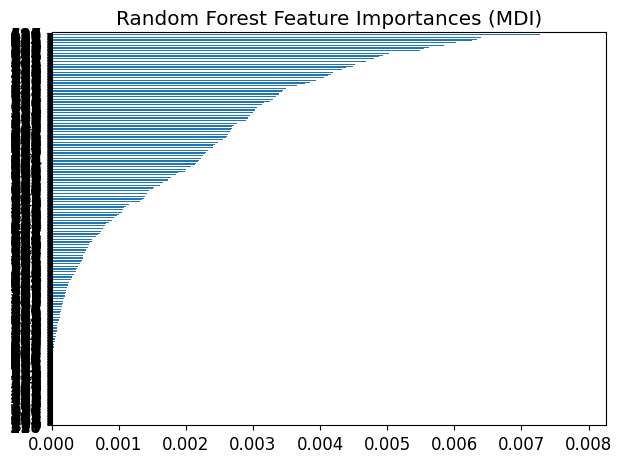

In [57]:

# feature_names = model[:-1].get_feature_names_out()

mdi_importances = pd.Series(
    model[-1].feature_importances_
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Feature Importances (MDI)")
ax.figure.tight_layout()

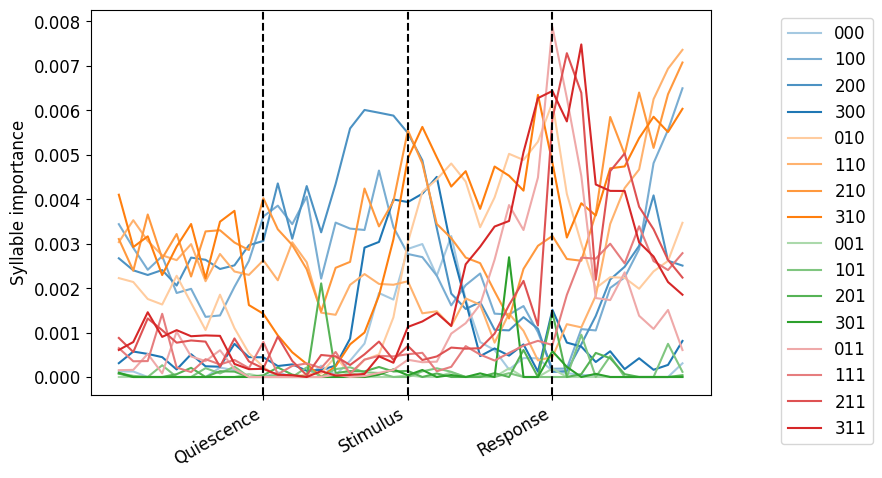

In [109]:
palette_16 = create_grouped_gradient_palette(n_groups=4, shades_per_group=4, base_palette='tab10')
palette_16_list = [palette_16(i) for i in range(palette_16.N)]  # Extract colors properly
order = ['000', '100', '200', '300', '010', '110',
           '210', '310', '001', '101', '201', '301', '011',
           '111', '211', '311']
state_to_color = dict(zip(order, palette_16_list))

fig, axs = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(8, 5))

sns.lineplot(x='timestep', y='importance', hue='syllable', data=reshaped_importances, 
             ax=axs, palette=palette_16_list)
axs.axvline(x=10, color='k', linestyle='--')
axs.axvline(x=20, color='k', linestyle='--')
axs.axvline(x=30, color='k', linestyle='--')
axs.legend(loc='upper left', bbox_to_anchor=(1.1, 1))
axs.set_ylabel('Syllable importance')
axs.set_xlabel('')
axs.set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')


## Cluster based on error 

In [96]:
trials = pd.DataFrame(use_sequences)
trials['mouse_name'] = merged_df['mouse_name']
trials['mouse_number'] = pd.factorize(merged_df['mouse_name'])[0]

In [97]:
distance_matrix = decoding_result.loc[decoding_result['shuffle'] == 0, 'confusion_matrix'].mean()

In [98]:
from scipy.spatial.distance import pdist, squareform

# Use cosine distance (1 - cosine similarity)
C_sym = (distance_matrix + distance_matrix.T) / 2
dist_matrix = squareform(pdist(C_sym, metric='cosine'))

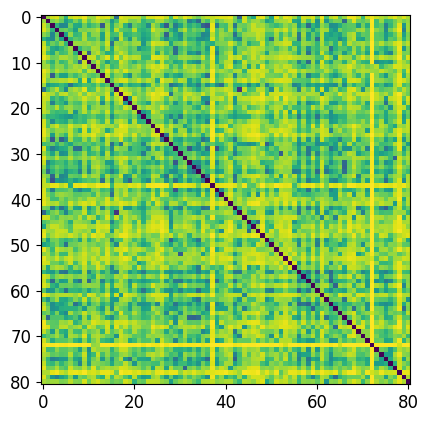

In [99]:
plt.imshow(dist_matrix)

/tmp/ipykernel_5234/3476648430.py:5: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(dist_matrix, method='average')  # You can also try 'complete', 'ward', etc.


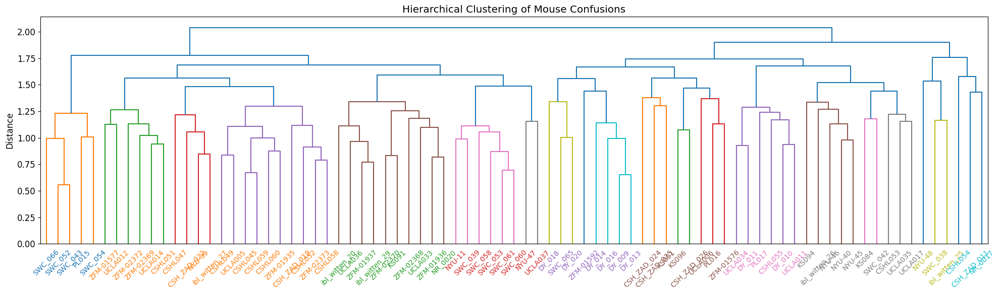

In [102]:
k = 10

from scipy.cluster.hierarchy import linkage, dendrogram
# Perform clustering
Z = linkage(dist_matrix, method='average')  # You can also try 'complete', 'ward', etc.

from scipy.cluster.hierarchy import ward, fcluster
clusters = fcluster(Z, t=k, criterion='maxclust')
clusters = clusters - 1


mouse_labels = trials['mouse_name'].unique()
# design_df['session_cluster'] = clusters 

# Plot dendrogram
fig, ax = plt.subplots(figsize=(20, 6))

# Define colors for clusters
cmap = plt.get_cmap(sns.color_palette("tab10", k, as_cmap=True))
# cmap = plt.get_cmap(sns.color_palette(k, as_cmap=True))
colors = [cmap(i % cmap.N) for i in range(k)]
cluster_colors = {i: colors[i] for i in range(k)}

# Plot dendrogram with colored labels
dendro = dendrogram(Z, labels=mouse_labels, leaf_font_size=10, ax=ax, leaf_rotation=45)

# Apply colors to tick labels
x_labels = ax.get_xmajorticklabels()
counter = 0
for lbl in x_labels:
    mouse_id = lbl.get_text()
    cluster_id = clusters[mouse_labels==mouse_id][0]
    lbl.set_color(cluster_colors[cluster_id])

plt.title("Hierarchical Clustering of Mouse Confusions")
plt.ylabel("Distance")
plt.tight_layout()

plt.show()

/tmp/ipykernel_5234/1449387188.py:5: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(dist_matrix, method='average')  # You can also try 'complete', 'ward', etc.
/home/ines/miniconda3/envs/iblenv/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:834: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  return linkage(y, method='ward', metric='euclidean')


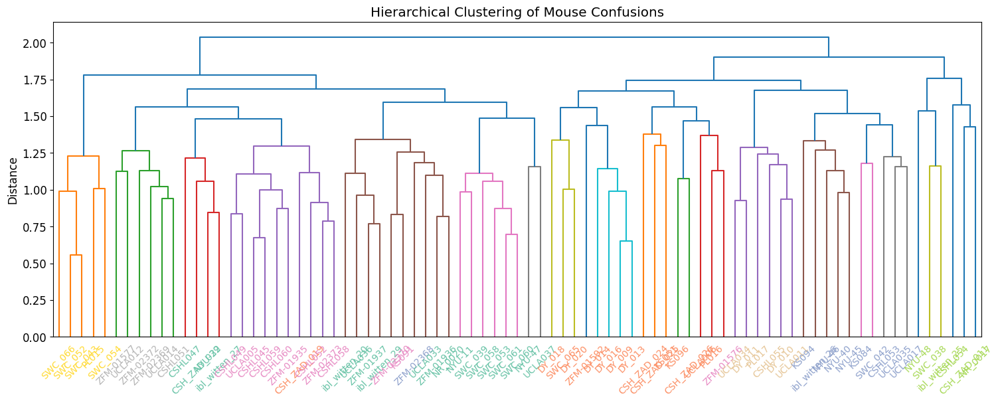

In [101]:
k = 10

from scipy.cluster.hierarchy import linkage, dendrogram
# Perform clustering
Z = linkage(dist_matrix, method='average')  # You can also try 'complete', 'ward', etc.

from sklearn.cluster import AgglomerativeClustering

clustering = AgglomerativeClustering(n_clusters=k).fit(dist_matrix)
clusters = clustering.labels_

mouse_labels = trials['mouse_name'].unique()
# design_df['session_cluster'] = clusters 

# Plot dendrogram
fig, ax = plt.subplots(figsize=(15, 6))

# Define colors for clusters
cmap = plt.get_cmap(sns.color_palette("Set2", k, as_cmap=True))
colors = [cmap(i % cmap.N) for i in range(k)]
cluster_colors = {i: colors[i] for i in range(k)}


# Plot dendrogram with colored labels
dendro = dendrogram(Z, labels=mouse_labels, leaf_font_size=10, ax=ax, leaf_rotation=45)

# Apply colors to tick labels
x_labels = ax.get_xmajorticklabels()
counter = 0
for lbl in x_labels:
    mouse_id = lbl.get_text()
    cluster_id = clusters[mouse_labels==mouse_id][0]
    lbl.set_color(cluster_colors[cluster_id])

plt.tight_layout()
plt.title("Hierarchical Clustering of Mouse Confusions")
plt.ylabel("Distance")
plt.show()


(array([ 5., 20., 10.,  8.,  8.,  8.,  6., 10.,  3.,  3.]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <BarContainer object of 10 artists>)

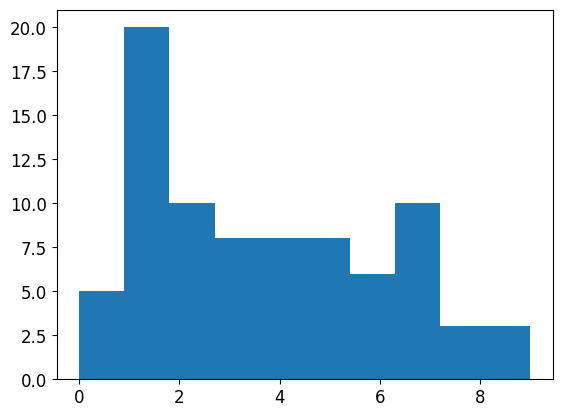

In [103]:
plt.hist(clusters)

# Visualize clusters

In [104]:
diagonal = pd.DataFrame(np.diag(decoding_result.loc[decoding_result['shuffle']==0, 'confusion_matrix'][0]))
diagonal['mouse_number'] = list(trials['mouse_number'].drop_duplicates())
diagonal = diagonal.rename(columns={0: 'accuracy'})

cluster_df = pd.DataFrame(clusters)
cluster_df['mouse_number'] = list(trials['mouse_number'].drop_duplicates())
cluster_df = cluster_df.rename(columns={0: 'mouse_cluster'})

trials = trials.merge(cluster_df, on=['mouse_number'])

In [184]:
wheel_0_mapping = {0:0, 1:1, 2:0, 3:0,
                 4:0, 5:1, 6:0, 7:0,
                 8:0, 9:1, 10:0, 11:0,
                 12:0, 13:1, 14:0, 15:0}
wheel_1_mapping = {0:0, 1:0, 2:1, 3:0,
                 4:0, 5:0, 6:1, 7:0,
                 8:0, 9:0, 10:1, 11:0,
                 12:0, 13:0, 14:1, 15:0}
wheel_2_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:0, 5:0, 6:0, 7:1,
                 8:0, 9:0, 10:0, 11:1,
                 12:0, 13:0, 14:0, 15:1}
wheel_3_mapping = {0:1, 1:0, 2:0, 3:0,
                 4:1, 5:0, 6:0, 7:0,
                 8:1, 9:0, 10:0, 11:0,
                 12:1, 13:0, 14:0, 15:0}
whisker_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:1, 5:1, 6:1, 7:1,
                 8:0, 9:0, 10:0, 11:0,
                 12:1, 13:1, 14:1, 15:1}
lick_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:0, 5:0, 6:0, 7:0,
                 8:1, 9:1, 10:1, 11:1,
                 12:1, 13:1, 14:1, 15:1}


## With error bars

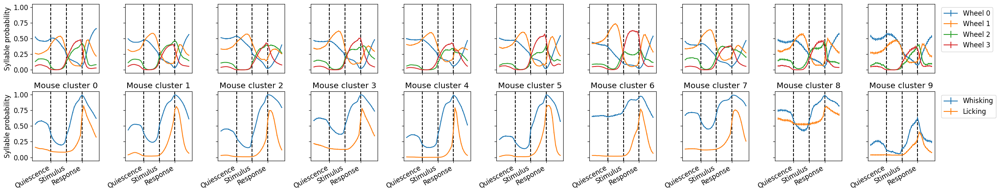

In [187]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set2", 7)
fig, axs = plt.subplots(2, np.max(clusters)+1, sharex=True, sharey=True, figsize=(25, 5))

for c, cluster in enumerate(np.arange(0, np.max(clusters)+1)):
    
    cluster_data = trials.loc[trials['mouse_cluster']==cluster]
    use_sequences = np.array(cluster_data.drop(columns=['mouse_name', 'mouse_number', 'mouse_cluster']))

    replace_whisker = np.vectorize(whisker_mapping.get)
    whisker_states = replace_whisker(use_sequences)
    replace_wheel_0 = np.vectorize(wheel_0_mapping.get)
    replace_wheel_1 = np.vectorize(wheel_1_mapping.get)
    replace_wheel_2 = np.vectorize(wheel_2_mapping.get)
    replace_wheel_3 = np.vectorize(wheel_3_mapping.get)
    wheel_state_0 = replace_wheel_0(use_sequences)    
    wheel_state_1 = replace_wheel_1(use_sequences)    
    wheel_state_2 = replace_wheel_2(use_sequences)    
    wheel_state_3 = replace_wheel_3(use_sequences)    
    replace_lick = np.vectorize(lick_mapping.get)
    lick_states = replace_lick(use_sequences)
    
    
    # Mean
    whisker_count = np.mean(whisker_states, axis=0)
    lick_count = np.mean(lick_states, axis=0)
    wheel_count_0 = np.mean(wheel_state_0, axis=0)
    wheel_count_1 = np.mean(wheel_state_1, axis=0)
    wheel_count_2 = np.mean(wheel_state_2, axis=0)
    wheel_count_3 = np.mean(wheel_state_3, axis=0)
        
    all_stacked = np.vstack([wheel_count_0, wheel_count_1, wheel_count_2, wheel_count_3,
                             whisker_count, lick_count])

    # Error
    whisker_error = np.std(whisker_states, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    lick_error = np.std(lick_states, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_0 = np.std(wheel_state_0, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_1 = np.std(wheel_state_1, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_2 = np.std(wheel_state_2, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_3 = np.std(wheel_state_3, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
        
    all_error_stacked = np.vstack([wheel_error_0, wheel_error_1, wheel_error_2, wheel_error_3, 
                                   whisker_error, lick_error])
    
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[0:1, :][0], yerr=all_error_stacked[0:1, :][0], label='Wheel 0')
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[1:2, :][0], yerr=all_error_stacked[1:2, :][0], label='Wheel 1')
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[2:3, :][0], yerr=all_error_stacked[2:3, :][0], label='Wheel 2')
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[3:4, :][0], yerr=all_error_stacked[3:4, :][0], label='Wheel 3')
      
    axs[1, c].errorbar(np.arange(0, 40, 1), all_stacked[4:5, :][0], yerr=all_error_stacked[4:5, :][0], label='Whisking')
    axs[1, c].errorbar(np.arange(0, 40, 1), all_stacked[5:6, :][0], yerr=all_error_stacked[5:6, :][0], label='Licking')

    axs[0, c].axvline(x=10, color='k', linestyle='--')
    axs[0, c].axvline(x=20, color='k', linestyle='--')
    axs[0, c].axvline(x=30, color='k', linestyle='--')
    axs[1, c].axvline(x=10, color='k', linestyle='--')
    axs[1, c].axvline(x=20, color='k', linestyle='--')
    axs[1, c].axvline(x=30, color='k', linestyle='--')

    axs[1, c].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    axs[1, c].set_title('Mouse cluster ' +str(cluster))
axs[0, c].legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[1, c].legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[0, 0].set_ylabel('Syllable probability')
axs[1, 0].set_ylabel('Syllable probability')
plt.tight_layout()
plt.show()


## Analyze entropy across trial per animal

In [ ]:
trials = pd.DataFrame(binarized)
trials['mouse_name'] = merged_df['mouse_name']
trials['mouse_number'] = pd.factorize(merged_df['mouse_name'])[0]
diagonal = pd.DataFrame(np.diag(decoding_result.loc[decoding_result['shuffle']==0, 'confusion_matrix'][0]))
diagonal['mouse_number'] = list(trials['mouse_number'].drop_duplicates())
diagonal = diagonal.rename(columns={0: 'accuracy'})
trials = trials.merge(diagonal, on=['mouse_number'])

Text(0.5, 0, 'Decoding accuracy')

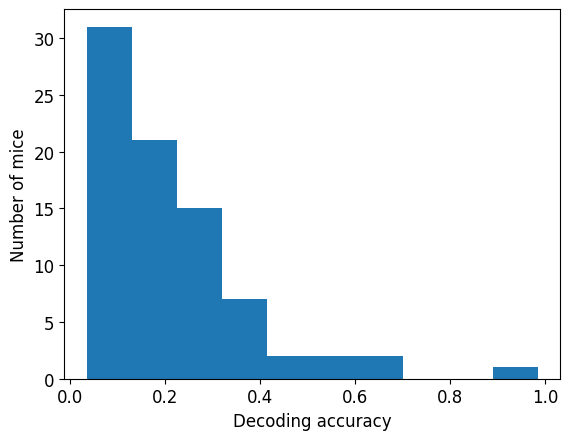

In [206]:
plt.hist(diagonal['accuracy'])
plt.ylabel('Number of mice')
plt.xlabel('Decoding accuracy')

In [186]:
entropy_df = pd.DataFrame(columns=['mouse_name',  'accuracy', 'bin', 'entropy'])

for m, mouse in enumerate(trials['mouse_name'].unique()):
    
    use_df = trials.loc[trials['mouse_name']==mouse]
    state_probs = np.mean(use_df.drop(columns=['mouse_name', 'mouse_number', 'accuracy']), axis=0)
    
    mouse_entropy = pd.DataFrame(columns=['mouse_name', 'accuracy', 'bin', 'entropy'], index=range(timesteps))
    mouse_entropy['mouse_name'] = mouse
    mouse_entropy['accuracy'] = list(use_df['accuracy'])[0]
    
    for t in range(timesteps):
        # label_binarizer = LabelBinarizer()
        # label_binarizer.fit(range(use_states))
        # encoded_arr = label_binarizer.transform(use_sequences[:, t])
        bin_data = state_probs[t*16:(t+1)*16]
        ent = entropy(bin_data)/np.log(16)
        mouse_entropy['entropy'][t] = ent
        mouse_entropy['bin'][t] = t
        
    entropy_df = pd.concat([entropy_df, mouse_entropy])
        
    

/tmp/ipykernel_19502/2226901285.py:18: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  mouse_entropy['entropy'][t] = ent
/tmp/ipykernel_19502/2226901285.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

In [210]:
entropy_df['accuracy_type'] = entropy_df['accuracy']
entropy_df.loc[entropy_df['accuracy_type']<.05, 'accuracy_type'] = 0
entropy_df.loc[entropy_df['accuracy_type']>.3, 'accuracy_type'] = 2
entropy_df.loc[(entropy_df['accuracy_type']>.05) &
               (entropy_df['accuracy_type']<.3), 'accuracy_type'] = 1



Text(0.5, 0, 'Trial events')

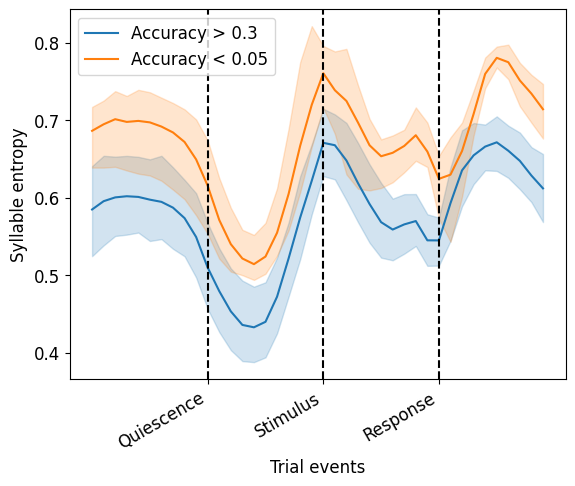

In [220]:
sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[entropy_df['accuracy']>.3], label='Accuracy > 0.3')
# sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[(entropy_df['accuracy']>.05) &
#                                                        (entropy_df['accuracy']<.3)])
sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[entropy_df['accuracy']<.05], label='Accuracy < 0.05')


plt.axvline(x=10, color='k', linestyle='--')
plt.axvline(x=20, color='k', linestyle='--')
plt.axvline(x=30, color='k', linestyle='--')

plt.xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
plt.ylabel('Syllable entropy')
plt.xlabel('Trial events')

## Vizualize results

In [216]:
wheel_mapping = {0:0, 1:1, 2:2, 3:3,
                 4:0, 5:1, 6:2, 7:3,
                 8:0, 9:1, 10:2, 11:3,
                 12:0, 13:1, 14:2, 15:3}
whisker_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:1, 5:1, 6:1, 7:1,
                 8:0, 9:0, 10:0, 11:0,
                 12:1, 13:1, 14:1, 15:1}
lick_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:0, 5:0, 6:0, 7:0,
                 8:1, 9:1, 10:1, 11:1,
                 12:1, 13:1, 14:1, 15:1}
replace_wheel = np.vectorize(wheel_mapping.get)
# wheel_states = replace_wheel(use_sequences)
replace_whisker = np.vectorize(whisker_mapping.get)
# whisker_states = replace_whisker(use_sequences)
replace_lick = np.vectorize(lick_mapping.get)

In [ ]:
# select mice with very good decoding or bad

/tmp/ipykernel_19502/2601245174.py:51: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')


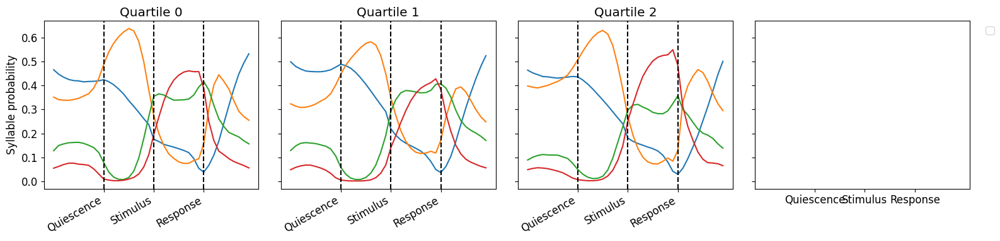

In [217]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set2", 7)
fig, axs = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(16, 4))

use_data = trial_clusters.merge(entropy_df[['mouse_name', 'accuracy_type']].drop_duplicates(), on=['mouse_name'])


for q, quartile in enumerate([0, 1, 2]):
    cluster_data = use_data.loc[use_data['accuracy_type']==quartile]
    sequences_choice = np.vstack(cluster_data[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
    use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]
    
    replace_whisker = np.vectorize(whisker_mapping.get)
    whisker_states = replace_whisker(use_sequences)
    replace_wheel = np.vectorize(wheel_mapping.get)
    wheel_states = replace_wheel(use_sequences)    
    replace_lick = np.vectorize(lick_mapping.get)
    lick_states = replace_lick(use_sequences)
    
    whisker_count = np.zeros((1, 40))
    lick_count = np.zeros((1, 40))
    wheel_count = np.zeros((4, 40))

    for b, bin in enumerate(range(40)):
        # counts, bins = np.histogram(use_sequences[:, b], range=(0,15), bins=16)
        whisker_count[0, b] = np.sum(whisker_states[:, b]==1)/len(whisker_states[:, b])
        lick_count[0, b] = np.sum(lick_states[:, b]==1)/len(lick_states[:, b])
        wheel_count[0, b] = np.sum(wheel_states[:, b]==1)/len(wheel_states[:, b])
        wheel_count[1, b] = np.sum(wheel_states[:, b]==2)/len(wheel_states[:, b])
        wheel_count[2, b] = np.sum(wheel_states[:, b]==3)/len(wheel_states[:, b])
        wheel_count[3, b] = np.sum(wheel_states[:, b]==0)/len(wheel_states[:, b])
    
    all_stacked = np.vstack([wheel_count, whisker_count, lick_count])
    # all_stacked = np.vstack([wheel_count])

    # cmap_value_1 = create_shaded_cmap(colors[q], name='cmap_value_1')
    # image = axs[c].imshow(all_stacked, cmap=cmap_value_1, aspect='auto')
    axs[q].plot(all_stacked[0:4, :].T, label=['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3'])
    # image = axs[q].imshow(all_stacked, cmap='Greys', aspect='auto')
    # fig.colorbar(image, ax=axs[q], location='right', anchor=(0, 0.3))
    # axs[q].set_yticks(np.arange(0, 6, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3', 'Whisking', 'Licking'])
    # axs[c].set_yticks(np.arange(0, 4, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3'])
    axs[q].axvline(x=10, color='k', linestyle='--')
    axs[q].axvline(x=20, color='k', linestyle='--')
    axs[q].axvline(x=30, color='k', linestyle='--')

    axs[q].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    # axs[c].set_xlabel('Time in epoch')
    axs[q].set_title('Quartile ' +str(quartile))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[0].set_ylabel('Syllable probability')
plt.tight_layout()
plt.show()

/tmp/ipykernel_19502/1841012585.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')


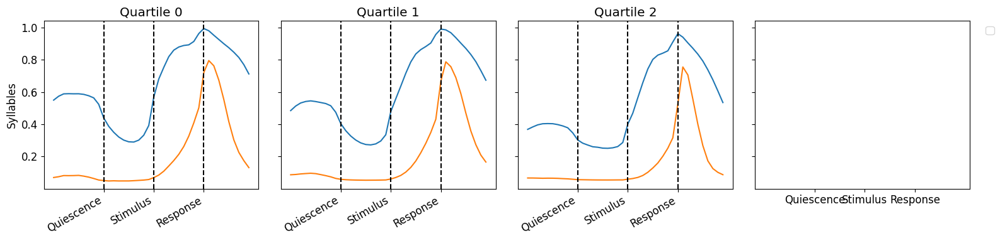

In [218]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set2", 7)
fig, axs = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(16, 4))

use_data = trial_clusters.merge(entropy_df[['mouse_name', 'accuracy_type']].drop_duplicates(), on=['mouse_name'])


for q, quartile in enumerate([0, 1, 2]):
    
    cluster_data = use_data.loc[use_data['accuracy_type']==quartile]
    sequences_choice = np.vstack(cluster_data[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
    use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]
    
    replace_whisker = np.vectorize(whisker_mapping.get)
    whisker_states = replace_whisker(use_sequences)
    replace_wheel = np.vectorize(wheel_mapping.get)
    wheel_states = replace_wheel(use_sequences)    
    replace_lick = np.vectorize(lick_mapping.get)
    lick_states = replace_lick(use_sequences)
    
    whisker_count = np.zeros((1, 40))
    lick_count = np.zeros((1, 40))
    wheel_count = np.zeros((4, 40))

    for b, bin in enumerate(range(40)):
        # counts, bins = np.histogram(use_sequences[:, b], range=(0,15), bins=16)
        whisker_count[0, b] = np.sum(whisker_states[:, b]==1)/len(whisker_states[:, b])
        lick_count[0, b] = np.sum(lick_states[:, b]==1)/len(lick_states[:, b])
        wheel_count[0, b] = np.sum(wheel_states[:, b]==1)/len(wheel_states[:, b])
        wheel_count[1, b] = np.sum(wheel_states[:, b]==2)/len(wheel_states[:, b])
        wheel_count[2, b] = np.sum(wheel_states[:, b]==3)/len(wheel_states[:, b])
        wheel_count[3, b] = np.sum(wheel_states[:, b]==0)/len(wheel_states[:, b])
    
    all_stacked = np.vstack([wheel_count, whisker_count, lick_count])
    # all_stacked = np.vstack([wheel_count])

    # cmap_value_1 = create_shaded_cmap(colors[q], name='cmap_value_1')
    # image = axs[c].imshow(all_stacked, cmap=cmap_value_1, aspect='auto')
    axs[q].plot(all_stacked[4:6, :].T, label=['Whisking', 'Licking'])
    # image = axs[q].imshow(all_stacked, cmap='Greys', aspect='auto')
    # fig.colorbar(image, ax=axs[q], location='right', anchor=(0, 0.3))
    # axs[q].set_yticks(np.arange(0, 6, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3', 'Whisking', 'Licking'])
    # axs[c].set_yticks(np.arange(0, 4, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3'])
    axs[q].axvline(x=10, color='k', linestyle='--')
    axs[q].axvline(x=20, color='k', linestyle='--')
    axs[q].axvline(x=30, color='k', linestyle='--')

    axs[q].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    # axs[c].set_xlabel('Time in epoch')
    axs[q].set_title('Quartile ' +str(quartile))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[0].set_ylabel('Syllables')
plt.tight_layout()
plt.show()